In [1]:
!wget https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DL0321EN/data/concrete_data_week4.zip

--2024-05-16 11:03:39--  https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DL0321EN/data/concrete_data_week4.zip
Resolving s3-api.us-geo.objectstorage.softlayer.net (s3-api.us-geo.objectstorage.softlayer.net)... 67.228.254.196
Connecting to s3-api.us-geo.objectstorage.softlayer.net (s3-api.us-geo.objectstorage.softlayer.net)|67.228.254.196|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 261483817 (249M) [application/zip]
Saving to: ‘concrete_data_week4.zip’

concrete_data_week4 100%[===================>] 249.37M  19.3MB/s    in 9.6s    

2024-05-16 11:03:49 (26.1 MB/s) - ‘concrete_data_week4.zip’ saved [261483817/261483817]



In [2]:
!unzip -q concrete_data_week4.zip

In [3]:
#from tensorflow.keras.applications.resnet50 import preprocess_input
import tensorflow as tf
from tensorflow.keras import layers

In [4]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model, load_model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, GlobalAveragePooling2D
from keras.applications.vgg16 import preprocess_input

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import cv2
import seaborn as sns

In [6]:
import os
import shutil

In [7]:
import datetime

In [8]:
num_classes = 2
image_resize = 224
batch_size_training = 100
batch_size_validation = 100

In [9]:
data_generator = ImageDataGenerator(preprocessing_function=preprocess_input, rescale=1./255)

In [10]:
train_generator = data_generator.flow_from_directory(
  "concrete_data_week4/train",
  target_size=(image_resize, image_resize),
  batch_size=batch_size_training,
  class_mode='categorical')

validation_generator = data_generator.flow_from_directory(
  "concrete_data_week4/valid",
  target_size=(image_resize, image_resize),
  batch_size=batch_size_validation,
  class_mode='categorical')

Found 30001 images belonging to 2 classes.
Found 9501 images belonging to 2 classes.


In [11]:
first_batch = train_generator.next()
first_batch

(array([[[[ 0.17278823,  0.1224353 ,  0.09537255],
          [ 0.1884745 ,  0.13812158,  0.11105883],
          [ 0.20023921,  0.14988628,  0.12282354],
          ...,
          [ 0.1884745 ,  0.13812158,  0.11105883],
          [ 0.1884745 ,  0.13812158,  0.11105883],
          [ 0.18455294,  0.1342    ,  0.10713726]],
 
         [[ 0.18063137,  0.13027844,  0.10321569],
          [ 0.19239607,  0.14204314,  0.1149804 ],
          [ 0.20416078,  0.15380785,  0.1267451 ],
          ...,
          [ 0.20023921,  0.14988628,  0.12282354],
          [ 0.20023921,  0.14988628,  0.12282354],
          [ 0.19631764,  0.14596471,  0.11890197]],
 
         [[ 0.18063137,  0.13027844,  0.10321569],
          [ 0.1884745 ,  0.13812158,  0.11105883],
          [ 0.19631764,  0.14596471,  0.11890197],
          ...,
          [ 0.20416078,  0.15380785,  0.1267451 ],
          [ 0.20416078,  0.15380785,  0.1267451 ],
          [ 0.20023921,  0.14988628,  0.12282354]],
 
         ...,
 
         [[ 

In [12]:
first_batch_images = train_generator.next()[0]
first_batch_images

array([[[[-3.68236494e-03, -1.87411755e-02, -1.05098058e-02],
         [ 8.08234140e-03, -6.97646849e-03,  1.25490082e-03],
         [ 2.37686168e-02,  8.70980695e-03,  1.69411767e-02],
         ...,
         [ 2.51219600e-01,  2.16552958e-01,  2.09098056e-01],
         [ 2.62984306e-01,  2.28317663e-01,  2.20862761e-01],
         [ 2.74749011e-01,  2.40082368e-01,  2.32627466e-01]],

        [[ 1.20039107e-02, -3.05489940e-03,  5.17646968e-03],
         [ 1.98470484e-02,  4.78823809e-03,  1.30196074e-02],
         [ 2.76901852e-02,  1.26313763e-02,  2.08627451e-02],
         ...,
         [ 2.51219600e-01,  2.16552958e-01,  2.09098056e-01],
         [ 2.62984306e-01,  2.28317663e-01,  2.20862761e-01],
         [ 2.70827442e-01,  2.36160800e-01,  2.28705898e-01]],

        [[ 3.55333239e-02,  2.04745140e-02,  2.87058838e-02],
         [ 3.16117555e-02,  1.65529456e-02,  2.47843135e-02],
         [ 3.16117555e-02,  1.65529456e-02,  2.47843135e-02],
         ...,
         [ 2.51219600e-0

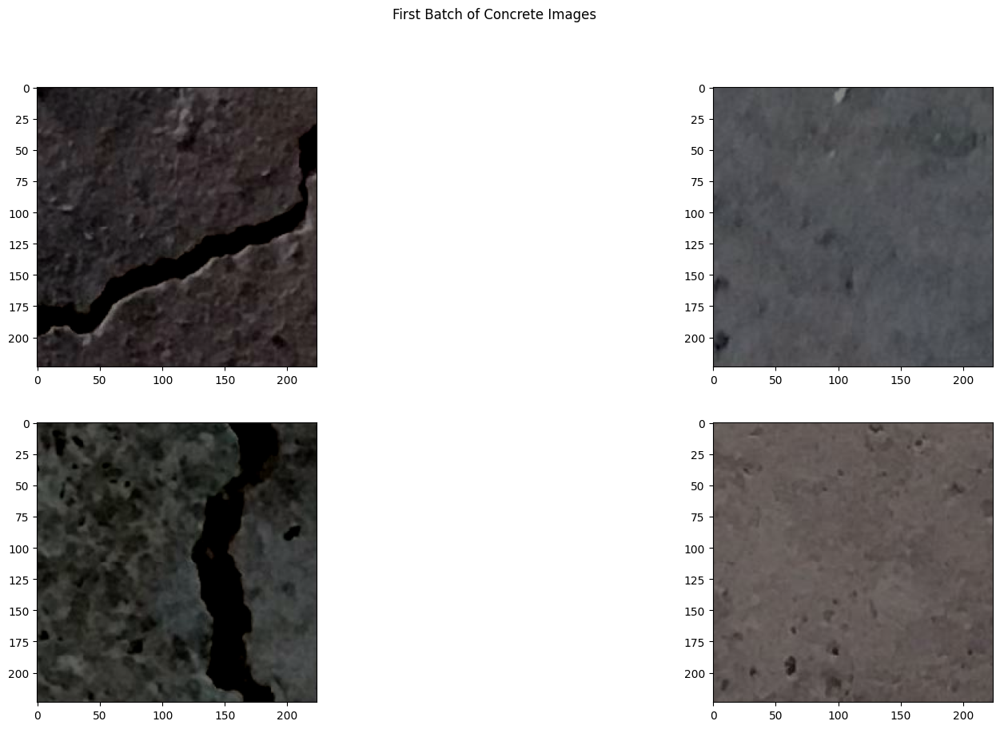

In [13]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 10)) # define your figure and axes

ind = 0
for ax1 in axs:
    for ax2 in ax1:
        image_data = first_batch_images[ind]
        #image_data = first_batch_images[ind].astype(np.uint8)
        ax2.imshow(image_data)
        ind += 1

fig.suptitle('First Batch of Concrete Images')
plt.show()

In [14]:
second_batch_images=train_generator.next()[0]
print(second_batch_images)

[[[[0.18455294 0.17733727 0.16596079]
   [0.18063137 0.1734157  0.16203922]
   [0.1767098  0.16949414 0.15811765]
   ...
   [0.15318039 0.14596471 0.15027452]
   [0.15318039 0.14596471 0.15027452]
   [0.15318039 0.14596471 0.15027452]]

  [[0.21200392 0.20478825 0.19341178]
   [0.21200392 0.20478825 0.19341178]
   [0.20416078 0.19694512 0.18556863]
   ...
   [0.14533725 0.13812158 0.14243138]
   [0.14533725 0.13812158 0.14243138]
   [0.14925882 0.14204314 0.14635295]]

  [[0.23945491 0.23223923 0.22086276]
   [0.24729805 0.24008237 0.2287059 ]
   [0.24337648 0.2361608  0.22478433]
   ...
   [0.15318039 0.14596471 0.15027452]
   [0.15318039 0.14596471 0.15027452]
   [0.15318039 0.14596471 0.15027452]]

  ...

  [[0.23553334 0.20870982 0.20125492]
   [0.23553334 0.20870982 0.20125492]
   [0.23553334 0.20870982 0.20125492]
   ...
   [0.2512196  0.24400394 0.23262747]
   [0.2512196  0.24400394 0.23262747]
   [0.2512196  0.24400394 0.23262747]]

  [[0.23553334 0.20870982 0.20125492]
   [0.2

In [15]:
third_batch_images=train_generator.next()[0]
print(third_batch_images)

[[[[ 0.31396472  0.31459218  0.318902  ]
   [ 0.32180786  0.32243532  0.32674512]
   [ 0.329651    0.33027846  0.33458826]
   ...
   [ 0.34925884  0.34596473  0.3424314 ]
   [ 0.34925884  0.34596473  0.33458826]
   [ 0.34533727  0.34204316  0.3306667 ]]

  [[ 0.31004316  0.3106706   0.31498042]
   [ 0.3178863   0.31851375  0.32282355]
   [ 0.32180786  0.32243532  0.32674512]
   ...
   [ 0.36102355  0.35772943  0.3541961 ]
   [ 0.35710198  0.35380787  0.3424314 ]
   [ 0.3531804   0.3498863   0.33850983]]

  [[ 0.3178863   0.31851375  0.32282355]
   [ 0.32180786  0.32243532  0.32674512]
   [ 0.32180786  0.32243532  0.32674512]
   ...
   [ 0.37278825  0.36949414  0.3659608 ]
   [ 0.36886668  0.36557257  0.3541961 ]
   [ 0.36886668  0.36557257  0.3541961 ]]

  ...

  [[ 0.274749    0.2753765   0.2796863 ]
   [ 0.27867058  0.27929807  0.28360787]
   [ 0.28259215  0.28321964  0.28752944]
   ...
   [ 0.31396472  0.30674905  0.31105885]
   [ 0.3061216   0.2989059   0.3032157 ]
   [ 0.29827845 

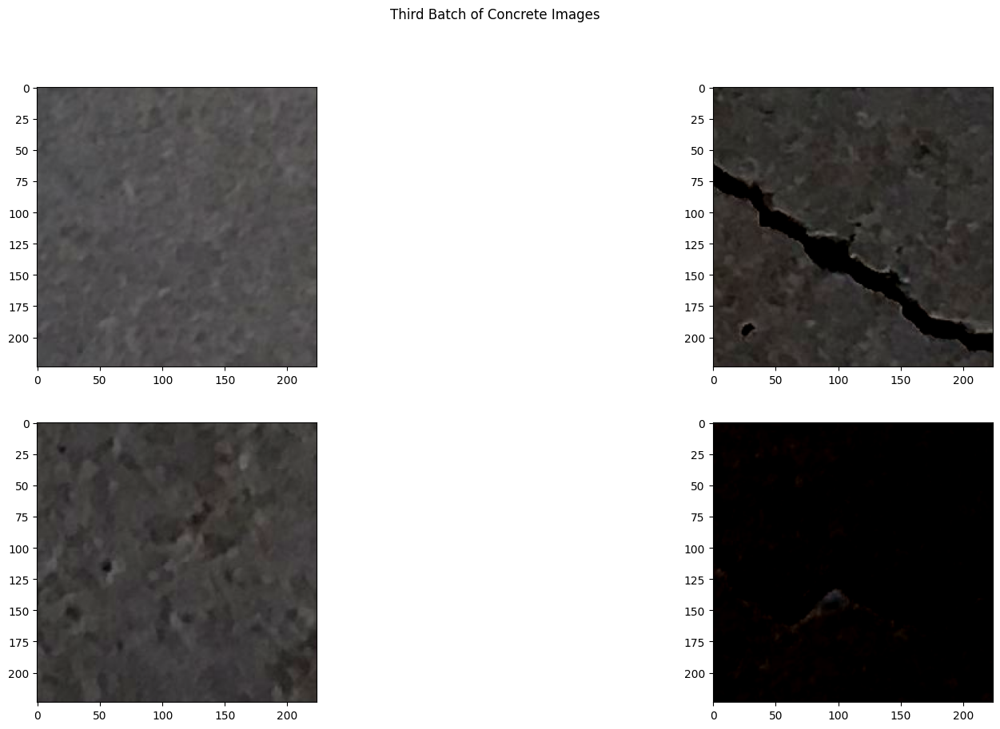

In [16]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 10)) # define your figure and axes

ind = 0
for ax1 in axs:
    for ax2 in ax1:
        image_data = third_batch_images[ind]
        #image_data = third_batch_images[ind].astype(np.uint8)
        ax2.imshow(image_data)
        ind += 1

fig.suptitle('Third Batch of Concrete Images')
plt.show()

In [17]:
fourth_batch_labels=train_generator.next()[1]
print("Negative (no cracks): ", sum(fourth_batch_labels[:, 0:1]))
print("Positive (with cracks): ", sum(fourth_batch_labels[:, 1:2]))
print(fourth_batch_labels)
print(len(fourth_batch_labels))

Negative (no cracks):  [48.]
Positive (with cracks):  [52.]
[[0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]]
100


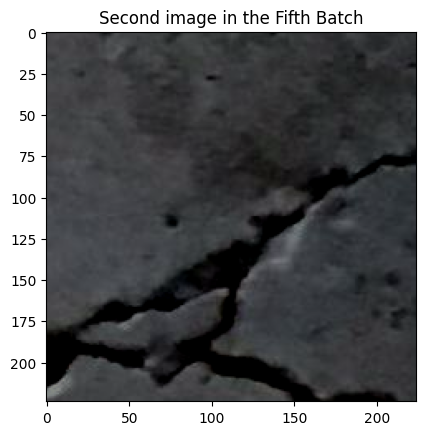

In [18]:
fifth_batch_images=train_generator.next()
plt.imshow(fifth_batch_images[0][1])
plt.title('Second image in the Fifth Batch')
plt.show()

In [19]:
fifth_batch_images[1]

array([[0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.

<br>
<h2 align=center id="compile_fit">Compile and Fit the Model</h2>

In [20]:
pwd

'/content'

In [21]:
!git clone https://github.com/doguilmak/Concrete-Crack-Classification-with-CAM.git

Cloning into 'Concrete-Crack-Classification-with-CAM'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 48 (delta 21), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (48/48), 8.15 MiB | 15.75 MiB/s, done.
Resolving deltas: 100% (21/21), done.


In [22]:
load_model('/content/Concrete-Crack-Classification-with-CAM/model.h5')

In [23]:
def model_block(inputs, num_classes):

  model = Sequential([

    layers.Conv2D(16, input_shape=(image_resize, image_resize, 3), kernel_size=(3,3),activation='relu',padding='same'),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(32, kernel_size=(3,3), activation='relu', padding='same'),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(64, kernel_size=(3,3), activation='relu', padding='same'),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(128, kernel_size=(3,3), activation='relu', padding='same'),
    layers.GlobalAveragePooling2D(),
    layers.Dense(num_classes, activation='softmax')

  ])
  model.compile(loss='categorical_crossentropy', metrics=['accuracy'],optimizer=tf.keras.optimizers.RMSprop(lr=0.001))
  model.summary()

  return model


In [24]:
model = model_block(224, 2) # 224x224 as pixels and 2 as crack classes

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 64)        0

In [25]:
num_epochs = 2
steps_per_epoch_training = len(train_generator)
steps_per_epoch_validation = len(validation_generator)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=steps_per_epoch_training,
    epochs=num_epochs,
    validation_data=validation_generator,
    validation_steps=steps_per_epoch_validation,
    verbose=1,
)

<ipython-input-25-a99e505353f0>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/2
301/301 [==============================] - 116s 368ms/step - loss: 0.2083 - accuracy: 0.9450 - val_loss: 0.2228 - val_accuracy: 0.9273
Epoch 2/2
301/301 [==============================] - 112s 372ms/step - loss: 0.0801 - accuracy: 0.9782 - val_loss: 0.0540 - val_accuracy: 0.9886


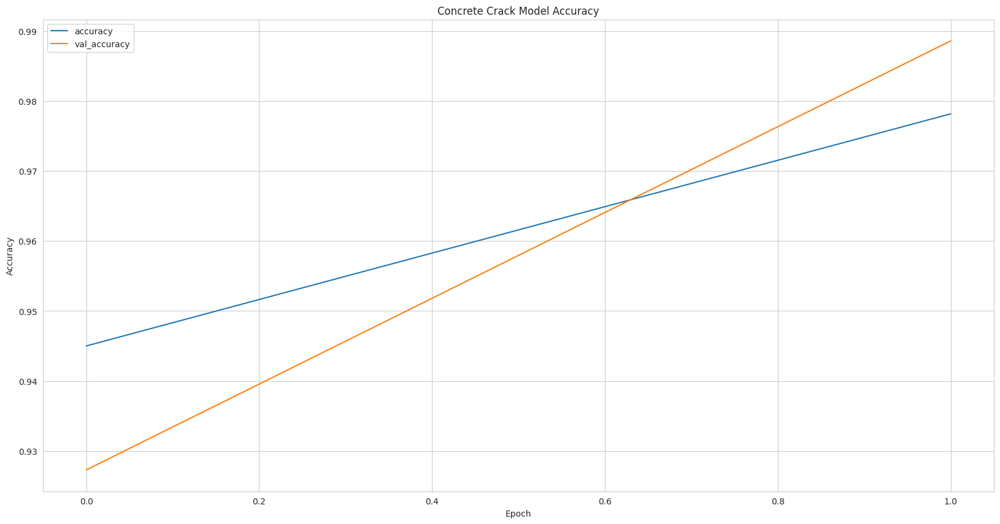

In [26]:
plt.figure(figsize=(20, 10))
sns.set_style('whitegrid')
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Concrete Crack Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='upper left')
plt.show()

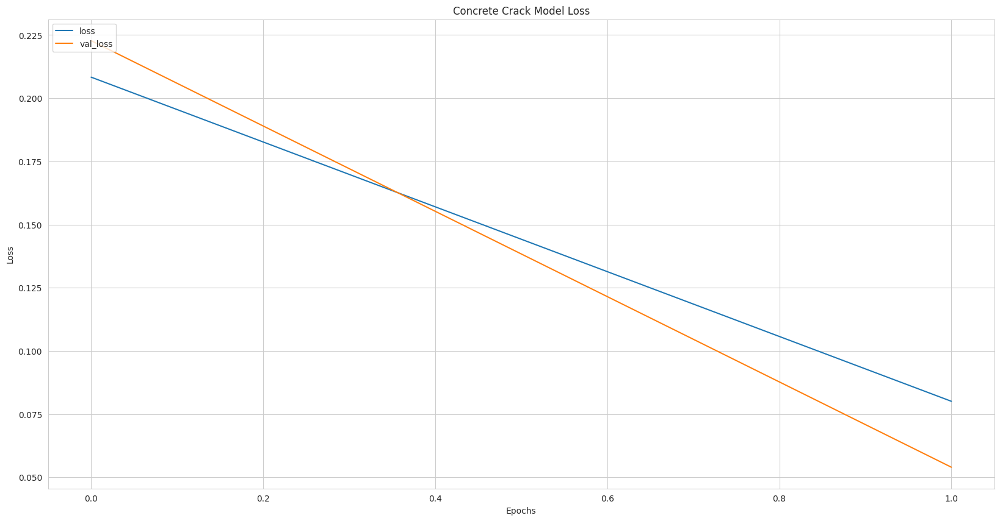

In [27]:
plt.figure(figsize=(20, 10))
sns.set_style('whitegrid')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Concrete Crack Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['loss', 'val_loss'], loc='upper left')
plt.show()

In [28]:
model.save("my_model.h5")
print("Model saved!")

Model saved!


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [29]:
# select all the layers for which you want to visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[1:9]]

# Define a new model that generates the above output
vis_model = Model(model.input, outputs)

# store the layer names we are interested in
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])


print("Layers that will be used for visualization: ")
print(layer_names)

Layers that will be used for visualization: 
['max_pooling2d', 'conv2d_1', 'max_pooling2d_1', 'conv2d_2', 'max_pooling2d_2', 'conv2d_3', 'global_average_pooling2d', 'dense']


In [30]:
gap_weights = model.layers[-1].get_weights()[0]
gap_weights.shape

cam_model  = Model(inputs=model.input, outputs=(model.layers[-3].output,model.layers[-1].output))
cam_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        1849

In [31]:
class_mapping = train_generator.class_indices
class_mapping

{'negative': 0, 'positive': 1}

In [32]:
def show_cam(image_value, features, results):
  '''
  Displays the class activation map of an image

  Args:
    image_value (tensor) -- preprocessed input image with size 224 x 224
    features (array) -- features of the image, shape (1, 28, 28, 128)
    results (array) -- output of the sigmoid layer
  '''

  # there is only one image in the batch so we index at `0`
  features_for_img = features[0]
  prediction = results[0]

  # there is only one unit in the output so we get the weights connected to it
  class_activation_weights = gap_weights[:,0]

  # upsample to the image size
  class_activation_features = sp.ndimage.zoom(features_for_img, (224/28, 224/28, 1), order=2)

  # compute the intensity of each feature in the CAM
  cam_output  = np.dot(class_activation_features,class_activation_weights)

  # visualize the results
  print(f'Output \nWithout Crack Probability: {results[0][0]} \nCrack Probability: {results[0][1]}')
  plt.figure(figsize=(8, 8))
  plt.imshow(cam_output, cmap='jet', alpha=0.5)
  plt.imshow(tf.squeeze(image_value), alpha=0.5)
  plt.show()


In [33]:
def convert_and_classify(image):

  # load the image
  img = cv2.imread(image)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # preprocess the image before feeding it to the model
  img = cv2.resize(img, (224, 224)) / 255.0

  # add a batch dimension because the model expects it
  tensor_image = np.expand_dims(img, axis=0)

  # get the features and prediction
  features,results = cam_model.predict(tensor_image)

  # generate the CAM
  show_cam(tensor_image, features, results)

1/1 [==============================] - 1s 529ms/step
Output 
Without Crack Probability: 0.002744043245911598 
Crack Probability: 0.9972559809684753


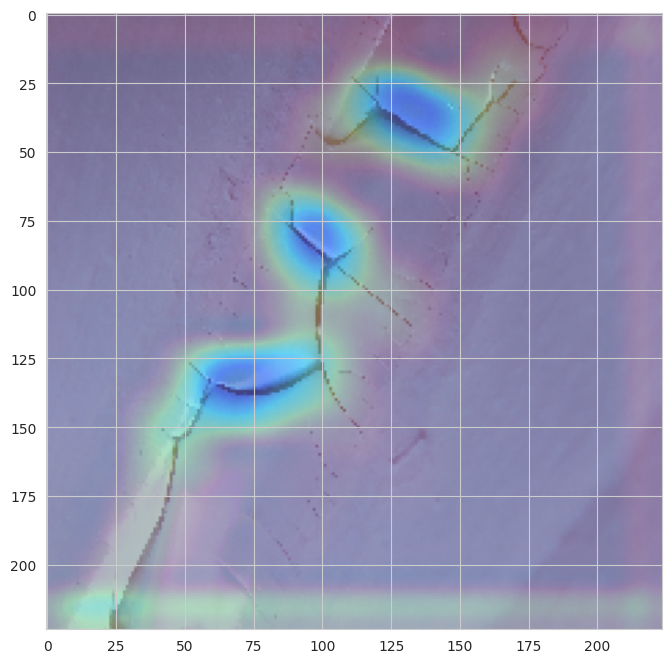

In [34]:
convert_and_classify('/content/205_18_76a0bfbe-6cc2-4443-bdd2-579e6181b0e9.jpg')

1/1 [==============================] - 0s 58ms/step
Output 
Without Crack Probability: 5.965814322585195e-14 
Crack Probability: 1.0


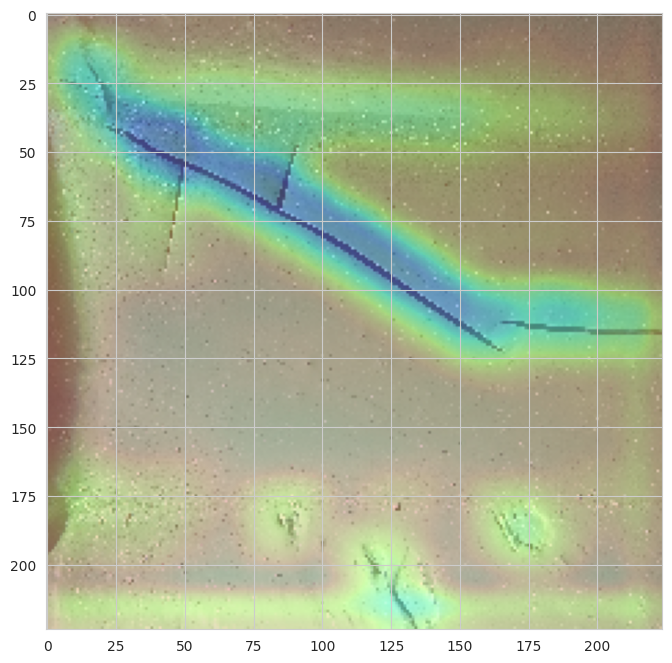

In [35]:
convert_and_classify('/content/205_18_5a510eb3-0880-4baf-9c0c-15c385b82735.jpg')

1/1 [==============================] - 0s 56ms/step
Output 
Without Crack Probability: 4.210347729708135e-16 
Crack Probability: 1.0


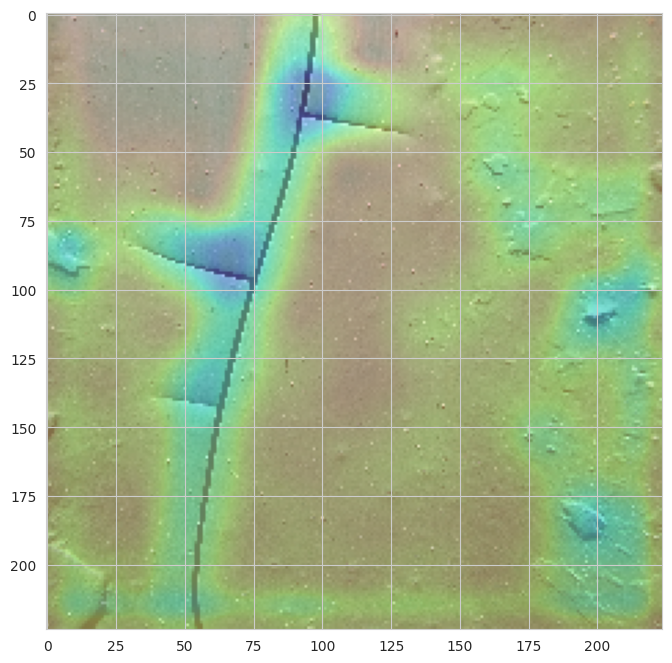

In [36]:
convert_and_classify('/content/205_18_473ef242-c111-404b-abc2-d5156e98de35.jpg')

1/1 [==============================] - 0s 34ms/step
Output 
Without Crack Probability: 0.015567783266305923 
Crack Probability: 0.9844322204589844


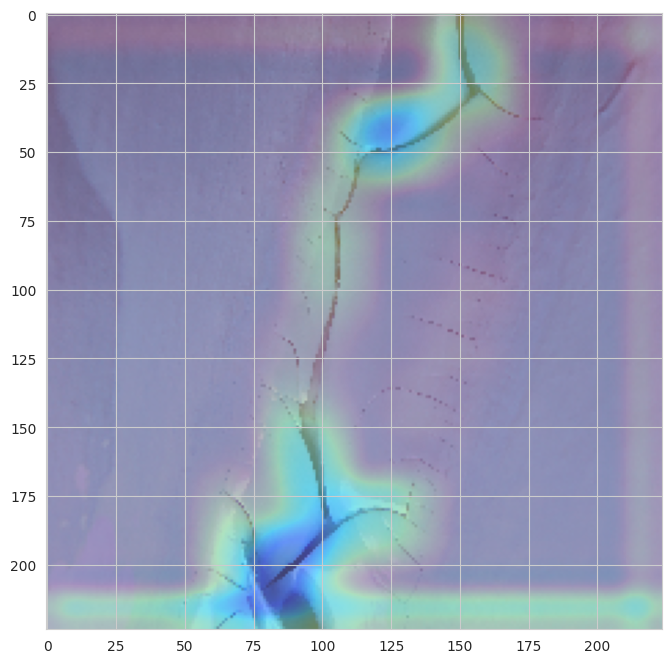

In [37]:
convert_and_classify('/content/205_18_3e002626-99e0-4452-be23-062d85058a7c.jpg')

1/1 [==============================] - 0s 19ms/step
Output 
Without Crack Probability: 0.0026921851094812155 
Crack Probability: 0.9973077774047852


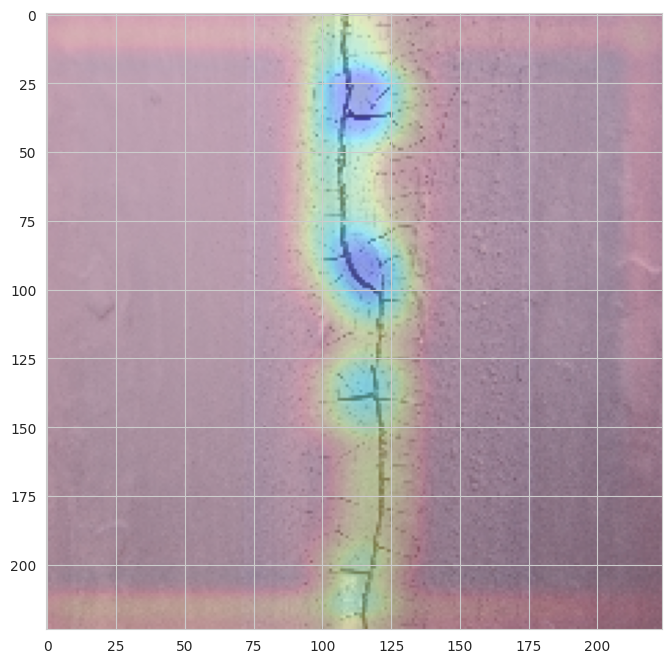

In [38]:
convert_and_classify('/content/205_18_082b4d40-a3f5-4a76-bbb2-cb5991c3f14a.jpg')

1/1 [==============================] - 0s 105ms/step
Output 
Without Crack Probability: 0.8851443529129028 
Crack Probability: 0.11485561728477478


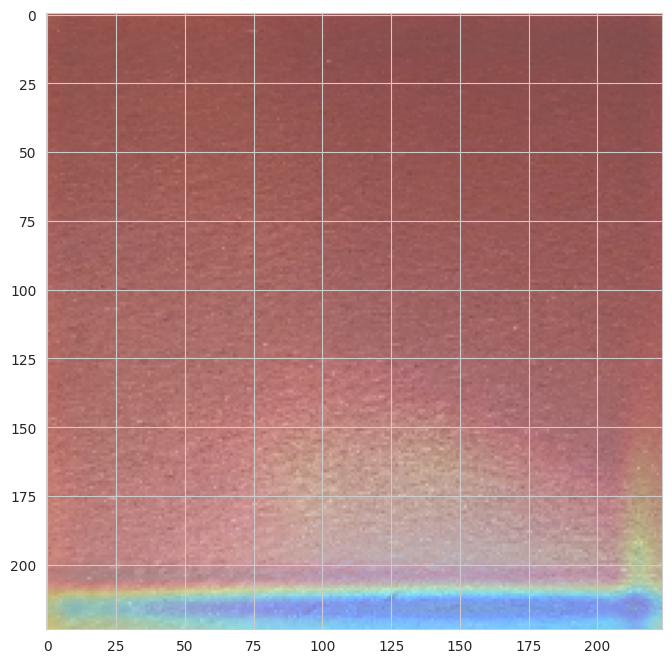

In [39]:
convert_and_classify('/content/101_13_1f22f5e2-87cc-4f12-bdaf-20e459573197.jpg')

1/1 [==============================] - 0s 19ms/step
Output 
Without Crack Probability: 6.367299049125918e-11 
Crack Probability: 1.0


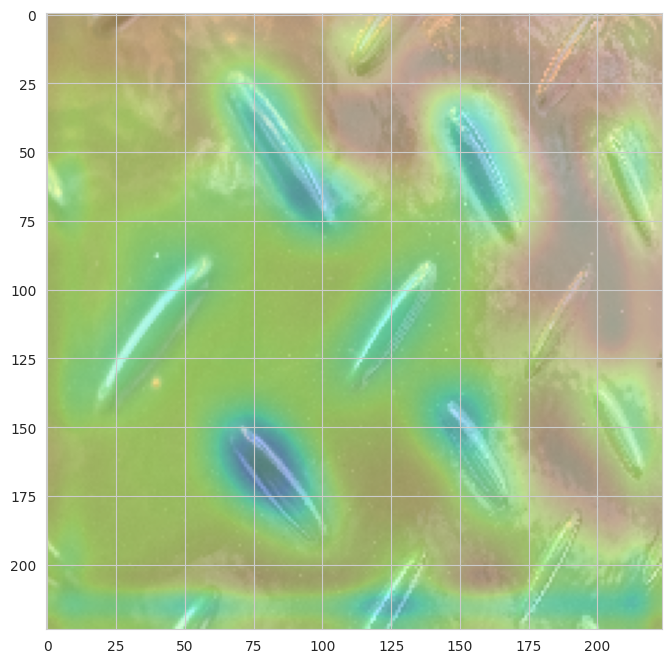

In [40]:
convert_and_classify('/content/101_13_1c740a6d-4d1e-4eb2-bdc2-a30f7e32e391.JPG')

1/1 [==============================] - 0s 34ms/step
Output 
Without Crack Probability: 1.0842565956181716e-07 
Crack Probability: 0.9999998807907104


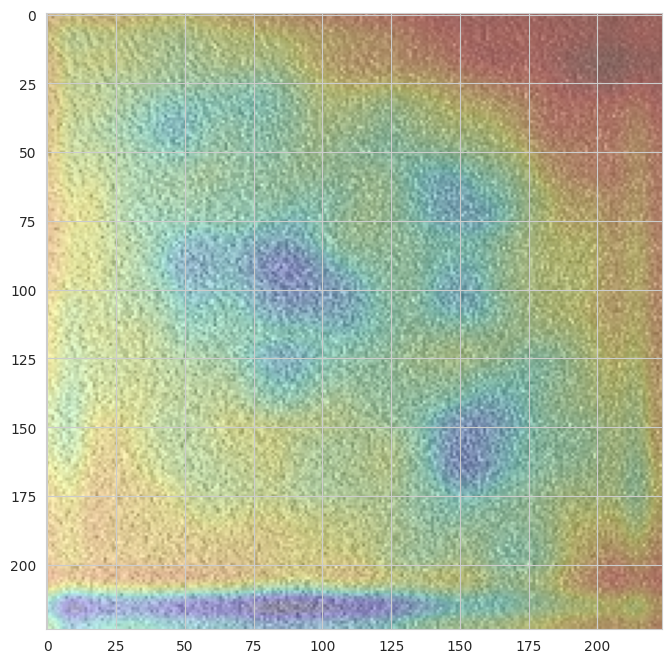

In [41]:
convert_and_classify('/content/101_13_0ff829db-87a6-43b8-9137-f1b877304e9f.JPG')

1/1 [==============================] - 0s 35ms/step
Output 
Without Crack Probability: 0.6207501292228699 
Crack Probability: 0.3792498707771301


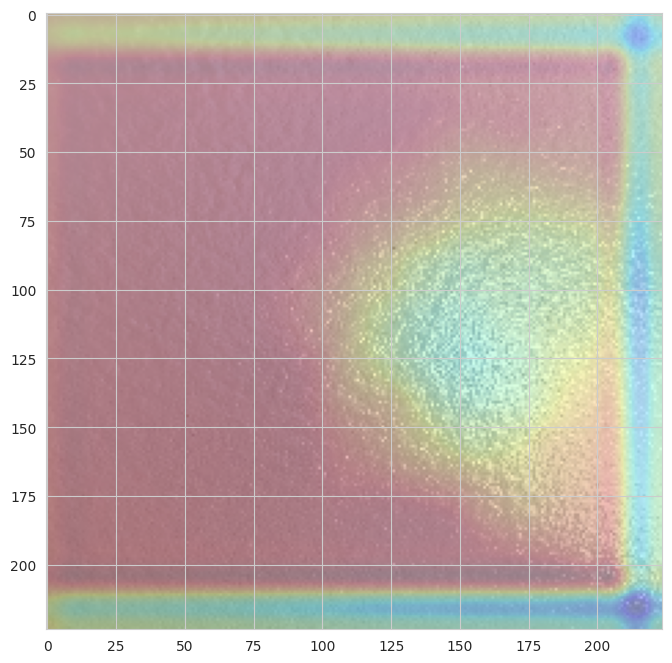

In [42]:
convert_and_classify('/content/101_13_0c25a618-7880-4295-abaf-b6a4d1f6ac16.JPG')

1/1 [==============================] - 0s 48ms/step
Output 
Without Crack Probability: 0.9114959836006165 
Crack Probability: 0.08850400894880295


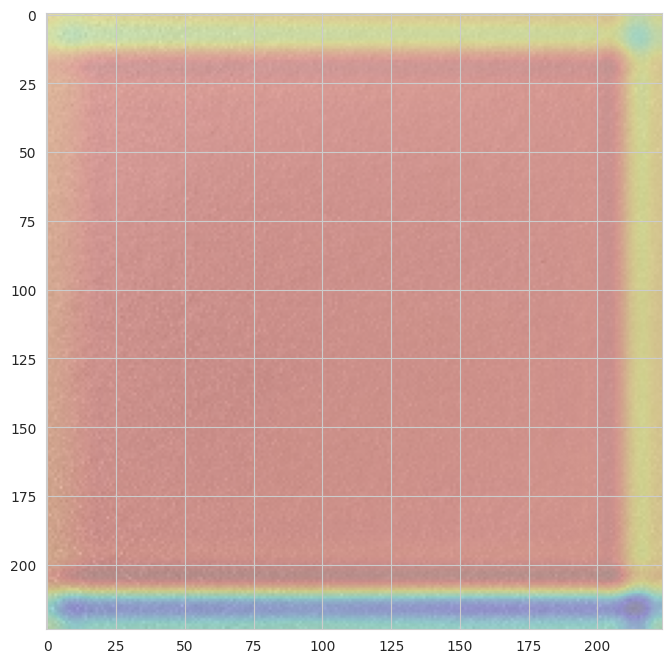

In [44]:
convert_and_classify('/content/101_13_2be4ed3b-ebdd-41dc-994f-840283d0685c.JPG')

1/1 [==============================] - 0s 29ms/step
Output 
Without Crack Probability: 0.8620070815086365 
Crack Probability: 0.1379929482936859


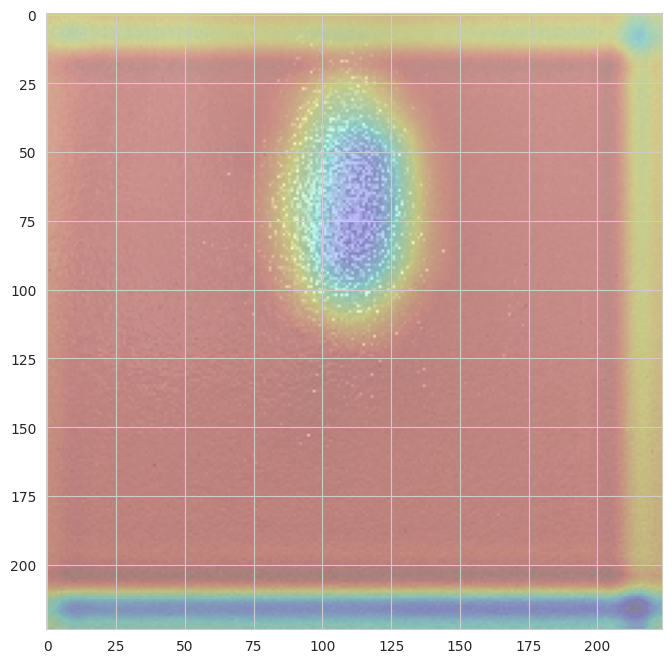

In [45]:
convert_and_classify('/content/101_13_2ae9170e-5d04-4db7-9038-d1f6cb3d3664.JPG')

1/1 [==============================] - 0s 27ms/step
Output 
Without Crack Probability: 0.11635953187942505 
Crack Probability: 0.8836404085159302


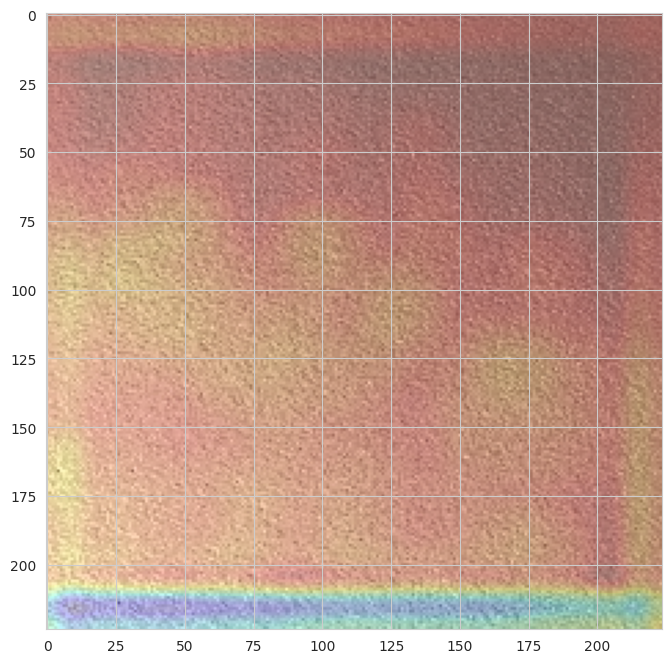

In [47]:
convert_and_classify('/content/101_13_1ef4088f-60c5-4672-a824-02ee3a80c9bc.JPG')

<br>
<h2 align=center id="make_dataframe">Make Dataframe for the Predictions</h2>

In [ ]:
test_generator = data_generator.flow_from_directory(
  '/content/concrete_data_week4/test',
  target_size=(image_resize, image_resize),
  shuffle=False,
  class_mode='categorical')

Found 500 images belonging to 2 classes.


In [ ]:
filenames=test_generator.filenames

In [ ]:
pred=model.predict_generator(test_generator, steps=len(test_generator), verbose=1).round(3)

<ipython-input-41-f85677f4f13d>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred=model.predict_generator(test_generator, steps=len(test_generator), verbose=1).round(3)


16/16 [==============================] - 2s 64ms/step


In [ ]:
filenames_df = pd.DataFrame(filenames, columns=['File Path'])
pred_df = pd.DataFrame(pred, columns=['Without Crack Probability', 'Crack Probability'])
model_predictions = pd.concat([filenames_df, pred_df], axis=1)
model_predictions

,File Path,Without Crack Probability,Crack Probability
0,negative/19751.jpg,0.980,0.020
1,negative/19752.jpg,0.988,0.012
2,negative/19753.jpg,0.989,0.011
3,negative/19754.jpg,0.984,0.016
4,negative/19755.jpg,0.981,0.019
...,...,...,...
495,positive/19996.jpg,0.000,1.000
496,positive/19997.jpg,0.000,1.000
497,positive/19998.jpg,0.063,0.937
498,positive/19999.jpg,0.000,1.000


In [ ]:
file_name='model_predictions.csv'
model_predictions.to_csv(file_name, sep=',', encoding='utf-8')

<br>
<h2 align=center id="upload_predict">Upload and Predict Your Picture!</h2>

Saving 00030.jpg to 00030.jpg
1/1 [==============================] - 0s 19ms/step
Output 
Without Crack Probability: 0.9444060921669006 
Crack Probability: 0.05559387430548668


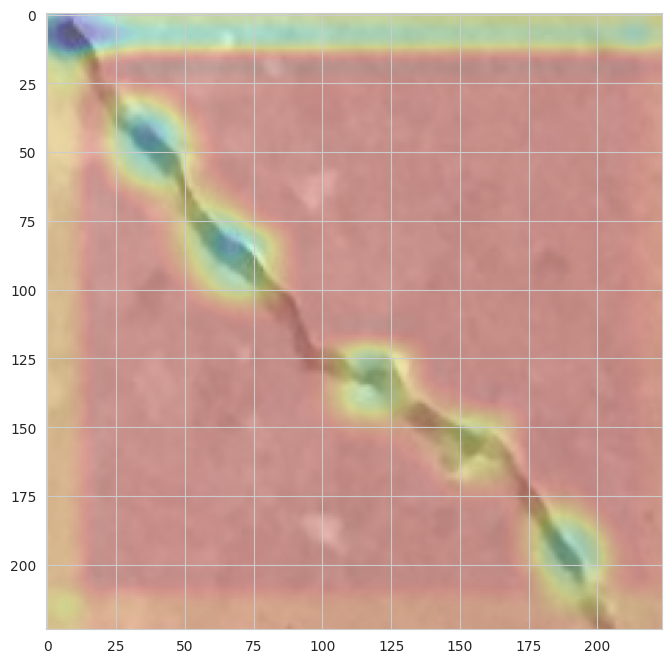

1/1 [==============================] - 0s 110ms/step
Without Crack Probability: % 0.0
Crack Probability: % 100.0


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  width = 224
  height = 224
  dim = (width, height)
  path = '/content/' + fn
  img = cv2.imread(path)
  convert_and_classify(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, dim)
  x = asarray(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print("Without Crack Probability: %", round(classes[0][0]*100, 2))
  print("Crack Probability: %", round(classes[0][1]*100, 2))

Saving 00018.jpg to 00018.jpg
1/1 [==============================] - 0s 18ms/step
Output 
Without Crack Probability: 0.9875946044921875 
Crack Probability: 0.012405358254909515


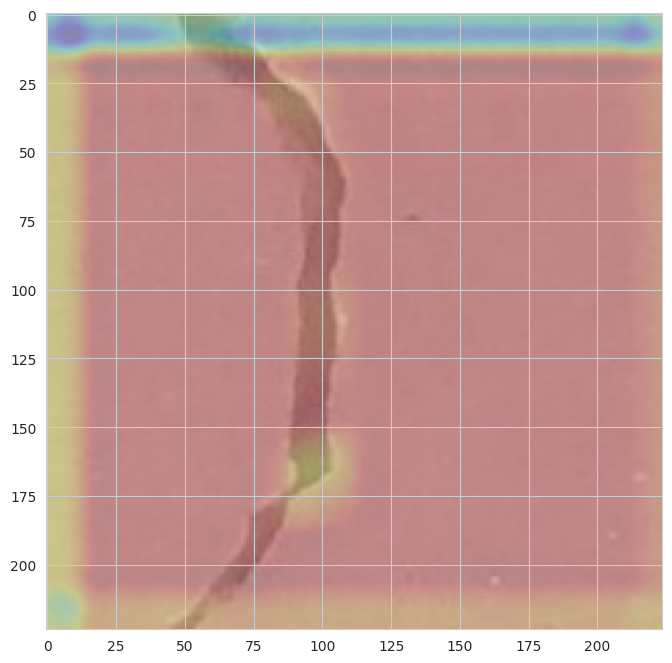

1/1 [==============================] - 0s 19ms/step
Without Crack Probability: % 0.0
Crack Probability: % 100.0


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  width = 224
  height = 224
  dim = (width, height)
  path = '/content/' + fn
  img = cv2.imread(path)
  convert_and_classify(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, dim)
  x = asarray(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print("Without Crack Probability: %", round(classes[0][0]*100, 2))
  print("Crack Probability: %", round(classes[0][1]*100, 2))

Saving 00210.jpg to 00210.jpg
1/1 [==============================] - 0s 20ms/step
Output 
Without Crack Probability: 0.950254499912262 
Crack Probability: 0.04974548891186714


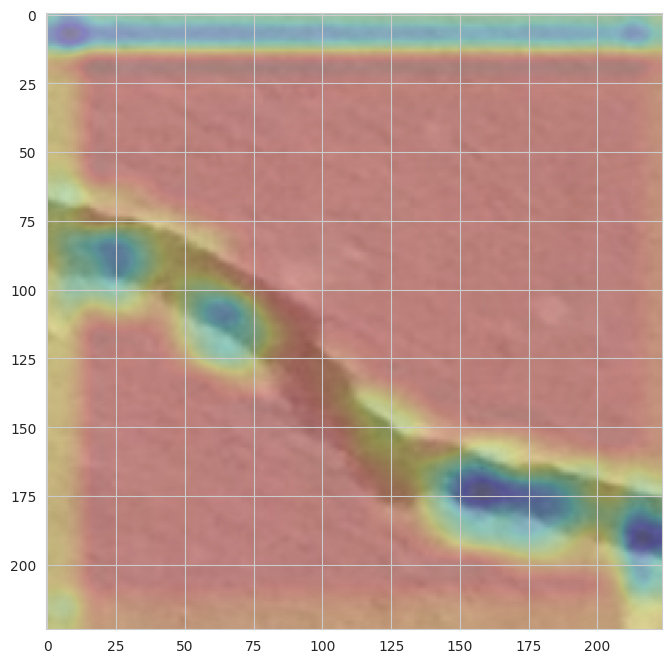

1/1 [==============================] - 0s 28ms/step
Without Crack Probability: % 0.0
Crack Probability: % 100.0


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  width = 224
  height = 224
  dim = (width, height)
  path = '/content/' + fn
  img = cv2.imread(path)
  convert_and_classify(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, dim)
  x = asarray(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print("Without Crack Probability: %", round(classes[0][0]*100, 2))
  print("Crack Probability: %", round(classes[0][1]*100, 2))

Saving 00054.jpg to 00054.jpg
1/1 [==============================] - 0s 22ms/step
Output 
Without Crack Probability: 0.9785944819450378 
Crack Probability: 0.021405460312962532


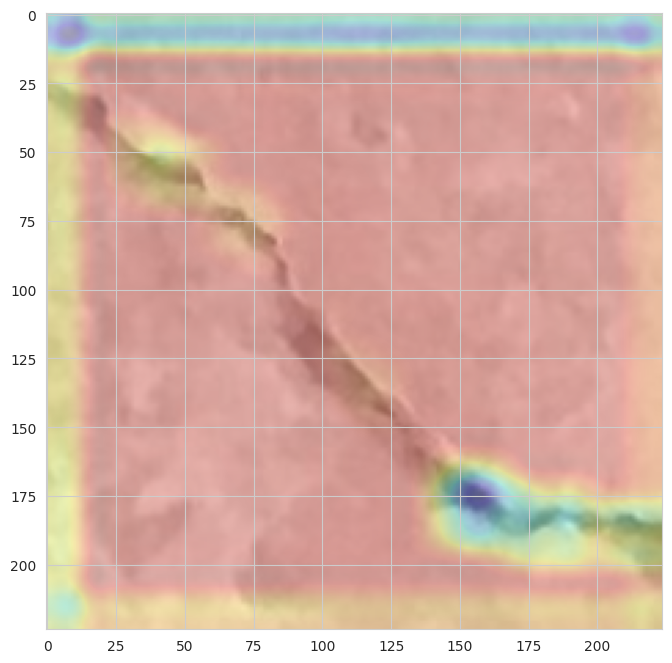

1/1 [==============================] - 0s 36ms/step
Without Crack Probability: % 0.0
Crack Probability: % 100.0


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  width = 224
  height = 224
  dim = (width, height)
  path = '/content/' + fn
  img = cv2.imread(path)
  convert_and_classify(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, dim)
  x = asarray(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print("Without Crack Probability: %", round(classes[0][0]*100, 2))
  print("Crack Probability: %", round(classes[0][1]*100, 2))

Saving 15058_1.jpg to 15058_1.jpg
1/1 [==============================] - 0s 21ms/step
Output 
Without Crack Probability: 0.8239734172821045 
Crack Probability: 0.17602655291557312


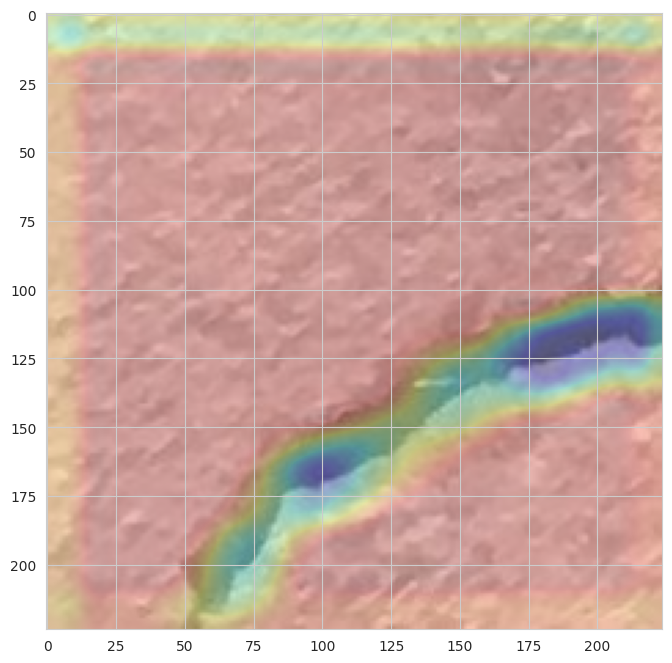

1/1 [==============================] - 0s 29ms/step
Without Crack Probability: % 0.0
Crack Probability: % 100.0


In [ ]:
from google.colab import files
from keras.preprocessing import image
from numpy import asarray

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  width = 224
  height = 224
  dim = (width, height)
  path = '/content/' + fn
  img = cv2.imread(path)
  convert_and_classify(path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, dim)
  x = asarray(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print("Without Crack Probability: %", round(classes[0][0]*100, 2))
  print("Crack Probability: %", round(classes[0][1]*100, 2))

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2024-01-15 06:49:37
